<a href="https://colab.research.google.com/github/banrawabdeh-cmd/Graduation-Project/blob/main/Graduation_Project_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/MyDrive/data po/"


'archive (5).zip'


In [ ]:
zip_path = "/content/drive/MyDrive/data po/archive (5).zip"


In [ ]:
import os, zipfile

extract_path = "/content/dataset_140k"
os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction completed")


Extraction completed


In [ ]:
for root, dirs, files in os.walk(extract_path):
    print(root, "→", dirs)
    break


/content/dataset_140k → ['real_vs_fake']


In [ ]:
base_path = "/content/dataset_140k/real_vs_fake/real-vs-fake"

train_path = f"{base_path}/train"
val_path   = f"{base_path}/valid"
test_path  = f"{base_path}/test"



In [ ]:
import os

print("Train exists:", os.path.exists(train_path))
print("Val exists:", os.path.exists(val_path))
print("Test exists:", os.path.exists(test_path))


Train exists: True
Val exists: True
Test exists: True


In [ ]:

# Delete bad images
from PIL import Image

def remove_bad_images(folder):
    bad = 0
    for root, dirs, files in os.walk(folder):
        for file in files:
            path = os.path.join(root, file)
            try:
                img = Image.open(path)
                img.verify()
            except:
                print("Deleted bad image:", path)
                os.remove(path)
                bad += 1
    print("Total bad images removed:", bad)

remove_bad_images(base_path)


Total bad images removed: 0


In [ ]:
for split in ["train", "valid", "test"]:
    for cls in ["real", "fake"]:
        folder = f"{base_path}/{split}/{cls}"
        print(split, cls, "→", len(os.listdir(folder)))

train real → 50000
train fake → 50000
valid real → 10000
valid fake → 10000
test real → 10000
test fake → 10000


In [ ]:
import os
import shutil
import random

def copy_half(src_dir, dst_dir):
    os.makedirs(dst_dir, exist_ok=True)

    images = os.listdir(src_dir)
    random.shuffle(images)

    half_size = len(images) // 2
    selected = images[:half_size]

    for img in selected:
        shutil.copy(os.path.join(src_dir, img), os.path.join(dst_dir, img))

root_real = f"{base_path}/"
root_new = "/content/dataset_half"

splits = ["train", "valid", "test"]
classes = ["real", "fake"]

for split in splits:
    for cls in classes:
        src = f"{base_path}/{split}/{cls}"
        dst = f"{root_new}/{split}/{cls}"
        copy_half(src, dst)

print("dataset_half created successfully")


dataset_half created successfully


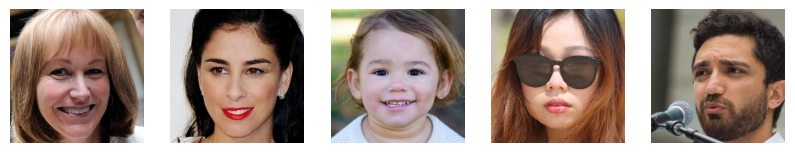

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

folder = f"{base_path}/train/real"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


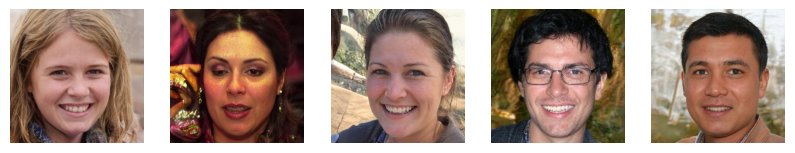

In [ ]:

import cv2
import matplotlib.pyplot as plt
import os

folder = f"{base_path}/train/fake"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


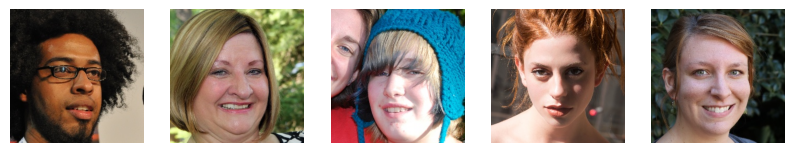

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

folder = f"{base_path}/valid/real"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


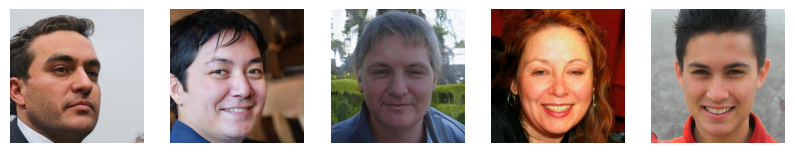

In [ ]:
folder = f"{base_path}/valid/fake"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


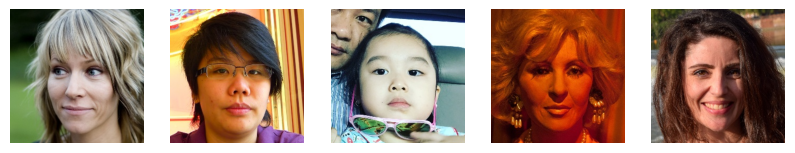

In [ ]:
folder = f"{base_path}/test/real"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


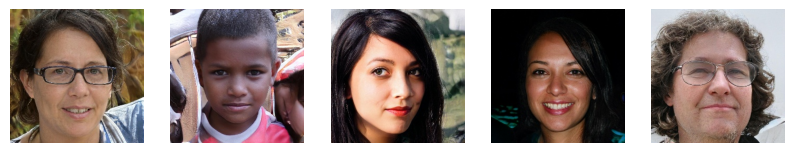

In [ ]:
folder = f"{base_path}/test/fake"
images = os.listdir(folder)[:5]

plt.figure(figsize=(10,4))
for i, img_name in enumerate(images):
    img = cv2.imread(os.path.join(folder, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.show()


In [ ]:
import cv2
import os

folder = f"{base_path}/train/real"
img_name = os.listdir(folder)[0]
img_path = os.path.join(folder, img_name)

img = cv2.imread(img_path)

print("Image name:", img_name)
print("Image shape:", img.shape)
h, w, c = img.shape
print("Height:", h)
print("Width:", w)
print("Channels:", c)


Image name: 63073.jpg
Image shape: (256, 256, 3)
Height: 256
Width: 256
Channels: 3


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader


data_root = "/content/dataset_half"

#  Augmentation + Resize + Normalize
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# val/test without augmentation
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])



In [ ]:
dataset_for_stats = ImageFolder(f"{data_root}/train", transform=transforms.ToTensor())
loader_for_stats = DataLoader(dataset_for_stats, batch_size=32, shuffle=False)

mean = 0.
std = 0.
nb_samples = 0.

for data, _ in loader_for_stats:
    batch_samples = data.size(0)
    data = data.view(batch_samples, data.size(1), -1)
    mean += data.mean(2).sum(0)
    std += data.std(2).sum(0)
    nb_samples += batch_samples

mean /= nb_samples
std /= nb_samples

print("From scratch mean:", mean)
print("From scratch std:", std)


From scratch mean: tensor([0.5201, 0.4255, 0.3804])
From scratch std: tensor([0.2491, 0.2239, 0.2212])


In [ ]:
train_transform_scratch = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

test_transform_scratch = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])


In [ ]:
# Load datasets pretrain
train_dataset = ImageFolder(f"{data_root}/train", transform=train_transform)
val_dataset   = ImageFolder(f"{data_root}/valid", transform=test_transform)
test_dataset  = ImageFolder(f"{data_root}/test", transform=test_transform)


In [ ]:
print("DataLoaders ready")
print("Train samples:", len(train_dataset))
print("Val samples:", len(val_dataset))
print("Test samples:", len(test_dataset))


DataLoaders ready
Train samples: 50000
Val samples: 10000
Test samples: 10000


In [ ]:
train_dataset_scratch= ImageFolder(f"{data_root}/train", transform=train_transform_scratch)
val_dataset_scratch   = ImageFolder(f"{data_root}/valid", transform=test_transform_scratch)
test_dataset_scratch = ImageFolder(f"{data_root}/test", transform=test_transform_scratch)


In [ ]:
print("From scratch datasets:")
print("Train samples:", len(train_dataset_scratch))
print("Val samples:", len(val_dataset_scratch))
print("Test samples:", len(test_dataset_scratch))


From scratch datasets:
Train samples: 50000
Val samples: 10000
Test samples: 10000


In [ ]:

use_pretrained = True

if use_pretrained:
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
    val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
    test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)
else:
    train_loader = DataLoader(train_dataset_scratch, batch_size=32, shuffle=True, num_workers=2)
    val_loader   = DataLoader(val_dataset_scratch, batch_size=32, shuffle=False, num_workers=2)
    test_loader  = DataLoader(test_dataset_scratch, batch_size=32, shuffle=False, num_workers=2)



In [ ]:
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

scratch_mean = mean
scratch_std  = std

In [ ]:
class_names = train_loader.dataset.classes


In [ ]:
def show_real_fake(loader, class_names, mean, std, title="", max_images=16):
    batch = next(iter(loader))
    images, labels = batch[0], batch[1]

    images = images[:max_images].detach().cpu()
    labels = labels[:max_images].detach().cpu()

    mean_t = torch.tensor(mean).view(1, -1, 1, 1)
    std_t  = torch.tensor(std).view(1, -1, 1, 1)

    images = images * std_t + mean_t
    images = images.clamp(0, 1)

    n = images.size(0)
    cols = int(n ** 0.5)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(cols * 3, rows * 3))
    if title:
        plt.suptitle(title, fontsize=14)

    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        img = images[i].permute(1, 2, 0).numpy()
        plt.imshow(img)

        lbl = int(labels[i].item())
        plt.title(class_names[lbl] if lbl < len(class_names) else str(lbl), fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
# Pretrained preprocessing loaders
train_loader_pre = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader_pre   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader_pre  = DataLoader(test_dataset, batch_size=32, shuffle=False)

# From-scratch preprocessing loaders
train_loader_scr = DataLoader(train_dataset_scratch, batch_size=32, shuffle=True)
val_loader_scr   = DataLoader(val_dataset_scratch, batch_size=32, shuffle=False)
test_loader_scr  = DataLoader(test_dataset_scratch, batch_size=32, shuffle=False)

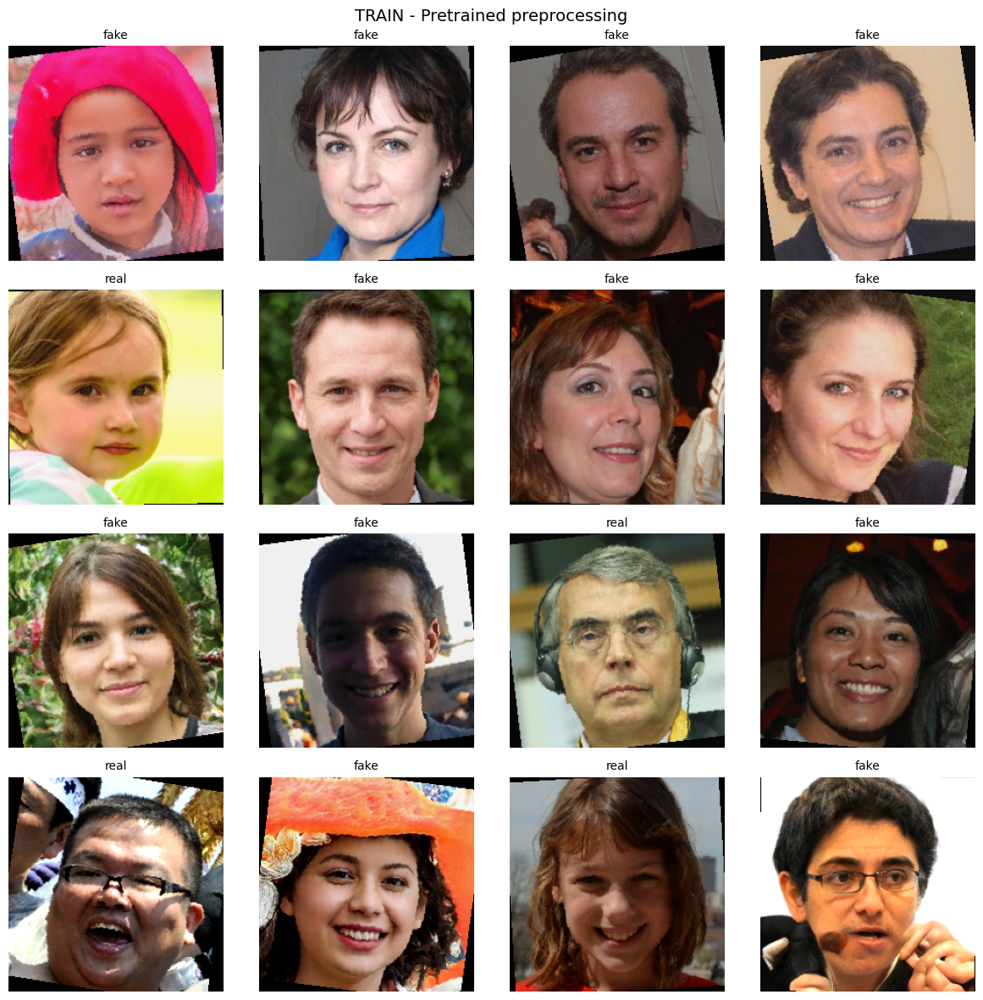

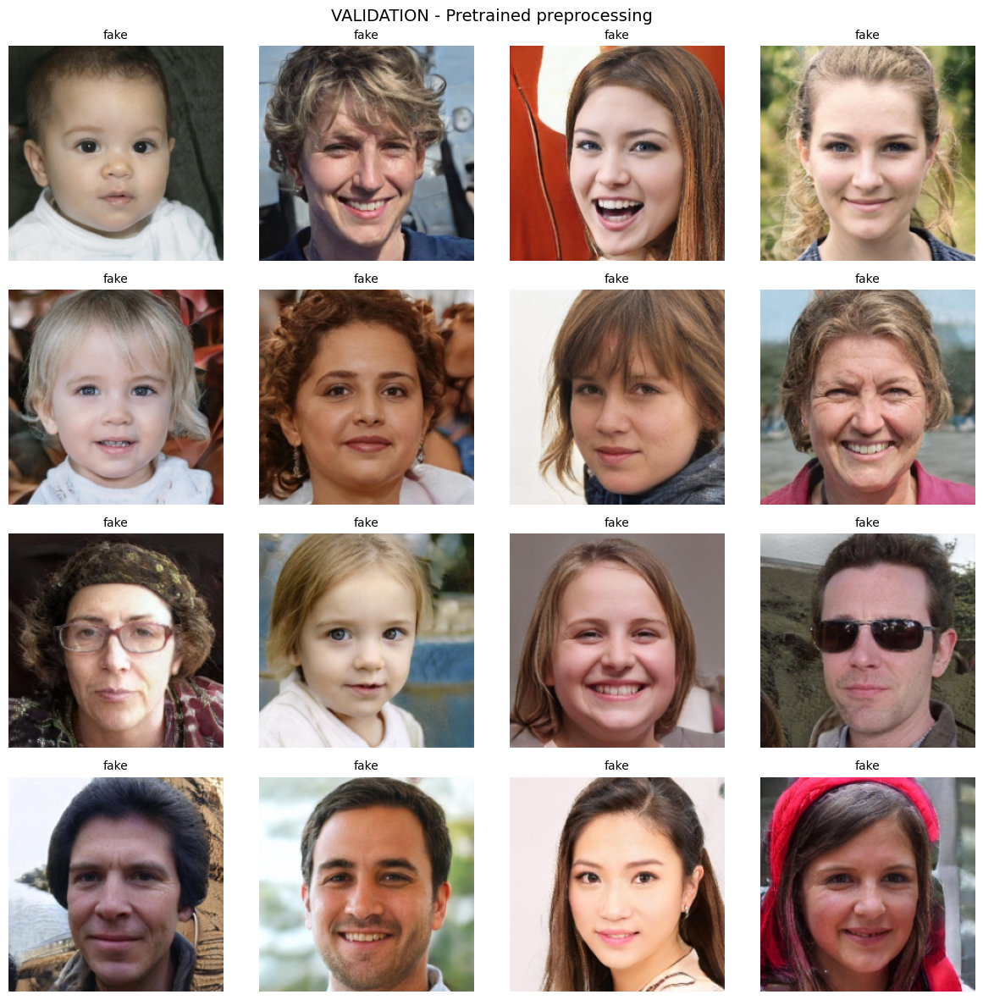

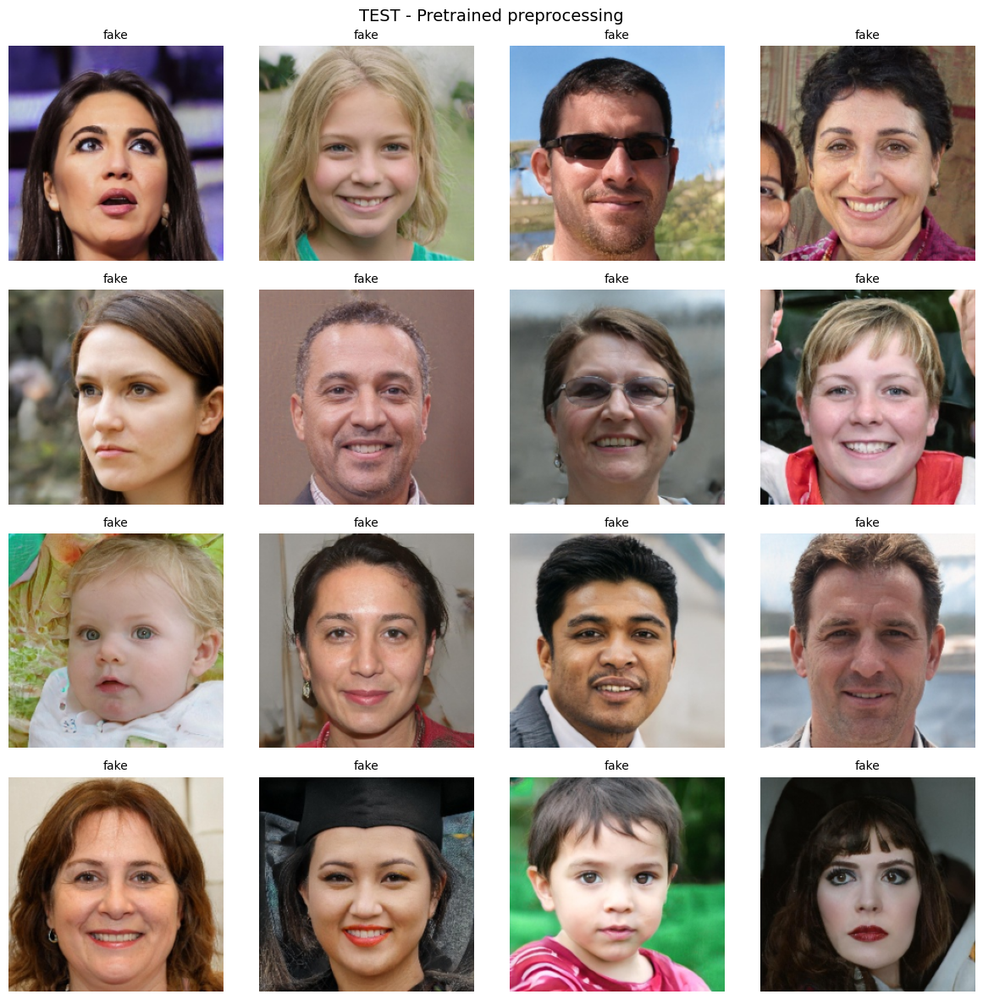

In [ ]:
show_real_fake(
    train_loader_pre, class_names,
    imagenet_mean, imagenet_std,
    "TRAIN - Pretrained preprocessing"
)

show_real_fake(
    val_loader_pre, class_names,
    imagenet_mean, imagenet_std,
    "VALIDATION - Pretrained preprocessing"
)

show_real_fake(
    test_loader_pre, class_names,
    imagenet_mean, imagenet_std,
    "TEST - Pretrained preprocessing"
)

/tmp/ipython-input-2336879006.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean_t = torch.tensor(mean).view(1, -1, 1, 1)
/tmp/ipython-input-2336879006.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  std_t  = torch.tensor(std).view(1, -1, 1, 1)


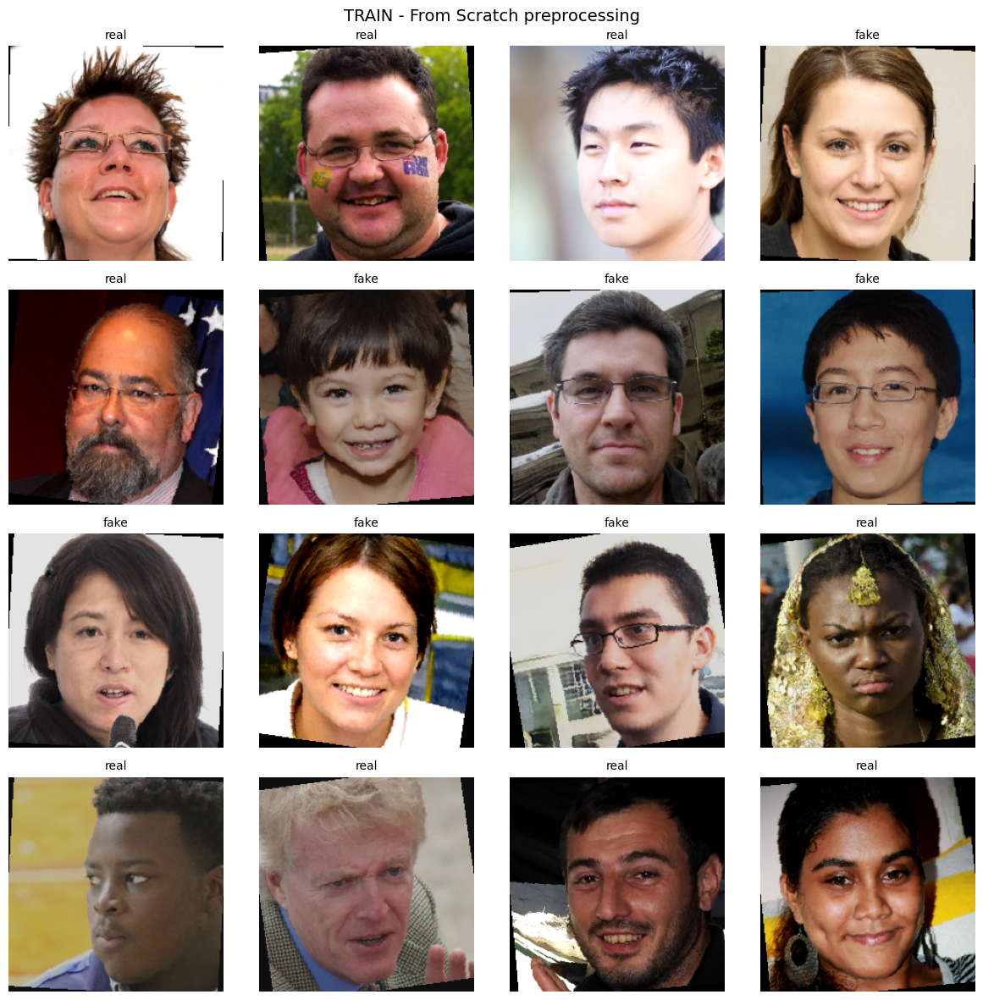

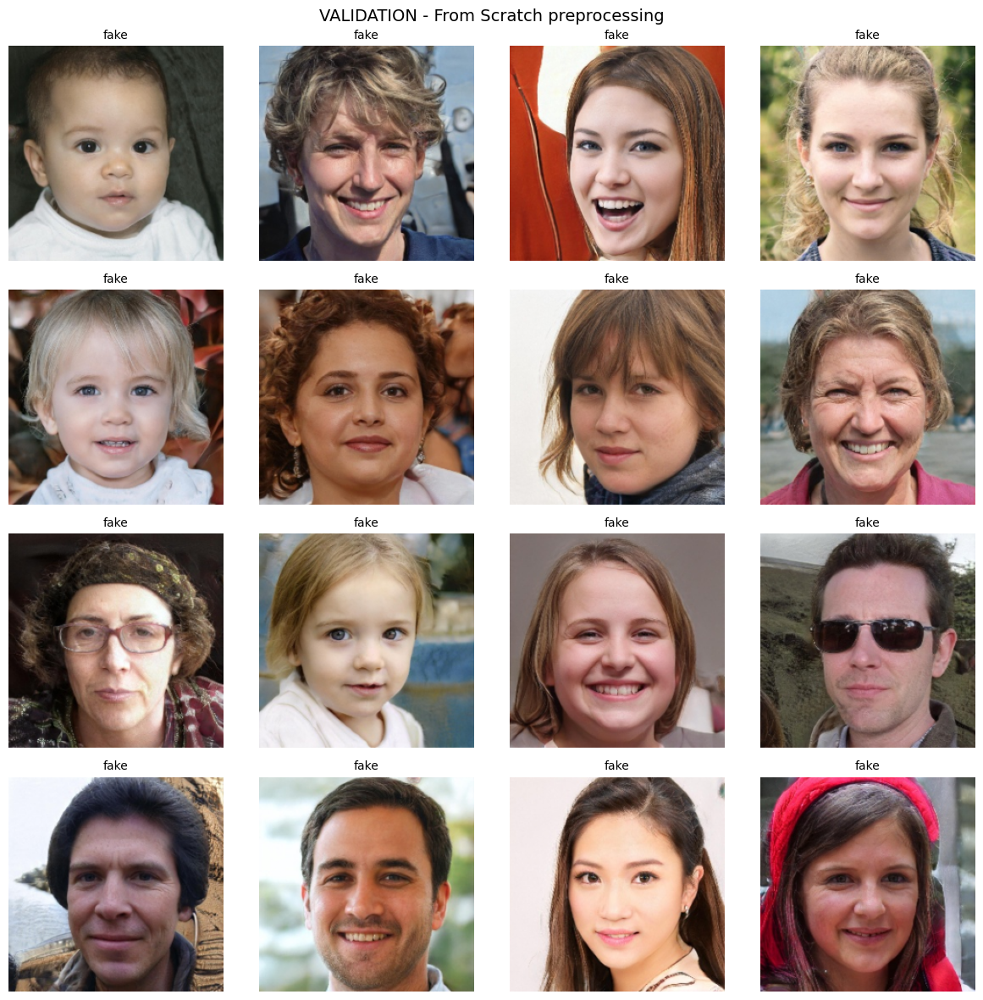

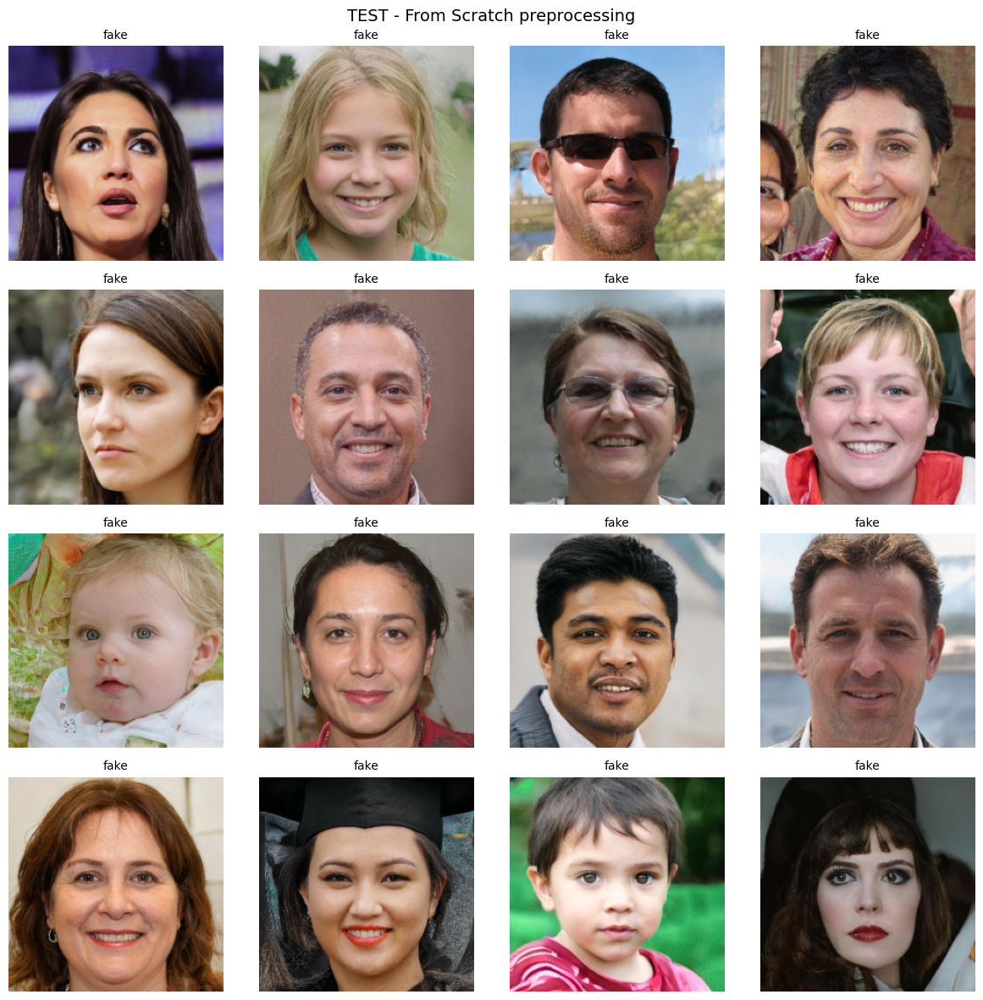

In [ ]:
show_real_fake(
    train_loader_scr, class_names,
    scratch_mean, scratch_std,
    "TRAIN - From Scratch preprocessing"
)

show_real_fake(
    val_loader_scr, class_names,
    scratch_mean, scratch_std,
    "VALIDATION - From Scratch preprocessing"
)

show_real_fake(
    test_loader_scr, class_names,
    scratch_mean, scratch_std,
    "TEST - From Scratch preprocessing"
)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

# Load MobileNetV2 pretrained
model = models.mobilenet_v2(weights="IMAGENET1K_V1")

# Modify the classifier
model.classifier[1] = nn.Linear(model.last_channel, 2)

model = model.to(device)

# Loss + Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)


Using: cuda


In [ ]:
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        correct += predicted.eq(labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


In [ ]:
def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
            total += labels.size(0)

    return running_loss / total, correct / total


In [ ]:
# Lists to store results
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

epochs = 30

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")

    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    # Save results for plots later
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc*100:.2f}%")

print("\nTraining finished and metrics saved!")



Epoch 1/30


Train Loss: 0.1799 | Train Acc: 92.49%
Val   Loss: 0.0543 | Val   Acc: 97.98%

Epoch 2/30


Train Loss: 0.0755 | Train Acc: 97.21%
Val   Loss: 0.0236 | Val   Acc: 99.21%

Epoch 3/30


Train Loss: 0.0549 | Train Acc: 97.92%
Val   Loss: 0.0201 | Val   Acc: 99.33%

Epoch 4/30


Train Loss: 0.0417 | Train Acc: 98.48%
Val   Loss: 0.0224 | Val   Acc: 99.10%

Epoch 5/30


Train Loss: 0.0354 | Train Acc: 98.75%
Val   Loss: 0.0190 | Val   Acc: 99.38%

Epoch 6/30


Train Loss: 0.0323 | Train Acc: 98.88%
Val   Loss: 0.0183 | Val   Acc: 99.33%

Epoch 7/30


Train Loss: 0.0268 | Train Acc: 99.02%
Val   Loss: 0.0151 | Val   Acc: 99.44%

Epoch 8/30


Train Loss: 0.0218 | Train Acc: 99.20%
Val   Loss: 0.0145 | Val   Acc: 99.50%

Epoch 9/30


Train Loss: 0.0218 | Train Acc: 99.21%
Val   Loss: 0.0138 | Val   Acc: 99.46%

Epoch 10/30


Train Loss: 0.0205 | Train Acc: 99.24%
Val   Loss: 0.0094 | Val   Acc: 99.67%

Epoch 11/30


Train Loss: 0.0177 | Train Acc: 99.37%
Val   Loss: 0.0072 | Val   Acc: 99.72%

Epoch 12/30


Train Loss: 0.0166 | Train Acc: 99.39%
Val   Loss: 0.0108 | Val   Acc: 99.61%

Epoch 13/30


Train Loss: 0.0157 | Train Acc: 99.44%
Val   Loss: 0.0081 | Val   Acc: 99.69%

Epoch 14/30


Train Loss: 0.0137 | Train Acc: 99.52%
Val   Loss: 0.0068 | Val   Acc: 99.75%

Epoch 15/30


Train Loss: 0.0153 | Train Acc: 99.42%
Val   Loss: 0.0119 | Val   Acc: 99.58%

Epoch 16/30


Train Loss: 0.0130 | Train Acc: 99.54%
Val   Loss: 0.0109 | Val   Acc: 99.59%

Epoch 17/30


Train Loss: 0.0119 | Train Acc: 99.54%
Val   Loss: 0.0096 | Val   Acc: 99.68%

Epoch 18/30


Train Loss: 0.0116 | Train Acc: 99.59%
Val   Loss: 0.0080 | Val   Acc: 99.75%

Epoch 19/30


Train Loss: 0.0102 | Train Acc: 99.61%
Val   Loss: 0.0091 | Val   Acc: 99.62%

Epoch 20/30


Train Loss: 0.0115 | Train Acc: 99.58%
Val   Loss: 0.0057 | Val   Acc: 99.77%

Epoch 21/30


Train Loss: 0.0098 | Train Acc: 99.64%
Val   Loss: 0.0135 | Val   Acc: 99.51%

Epoch 22/30


Train Loss: 0.0098 | Train Acc: 99.64%
Val   Loss: 0.0079 | Val   Acc: 99.74%

Epoch 23/30


Train Loss: 0.0101 | Train Acc: 99.61%
Val   Loss: 0.0093 | Val   Acc: 99.74%

Epoch 24/30


Train Loss: 0.0099 | Train Acc: 99.64%
Val   Loss: 0.0092 | Val   Acc: 99.68%

Epoch 25/30


Train Loss: 0.0089 | Train Acc: 99.68%
Val   Loss: 0.0081 | Val   Acc: 99.80%

Epoch 26/30


Train Loss: 0.0077 | Train Acc: 99.70%
Val   Loss: 0.0102 | Val   Acc: 99.55%

Epoch 27/30


Train Loss: 0.0102 | Train Acc: 99.63%
Val   Loss: 0.0093 | Val   Acc: 99.62%

Epoch 28/30


Train Loss: 0.0083 | Train Acc: 99.72%
Val   Loss: 0.0051 | Val   Acc: 99.78%

Epoch 29/30


Train Loss: 0.0080 | Train Acc: 99.72%
Val   Loss: 0.0074 | Val   Acc: 99.73%

Epoch 30/30


Train Loss: 0.0082 | Train Acc: 99.70%
Val   Loss: 0.0083 | Val   Acc: 99.77%

Training finished and metrics saved!


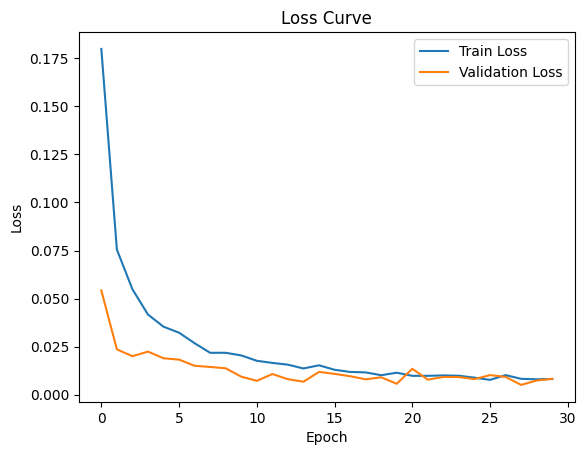

In [ ]:
import matplotlib.pyplot as plt

plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")
plt.show()


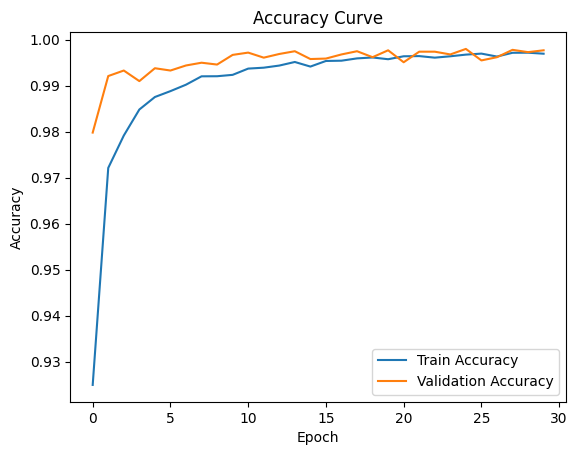

In [ ]:
plt.plot(train_accuracies, label="Train Accuracy")
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Curve")
plt.show()


In [ ]:
test_loss, test_acc = evaluate(model, test_loader, criterion)
print("\n Final Test Accuracy:", round(test_acc*100, 2), "%")



 Final Test Accuracy: 99.64 %


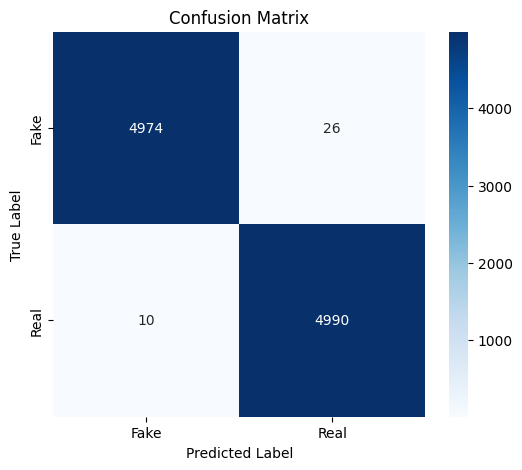


Classification Report:

              precision    recall  f1-score   support

        Fake       1.00      0.99      1.00      5000
        Real       0.99      1.00      1.00      5000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# est Evaluation + Confusion Matrix + Precision/Recall/F1
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = outputs.max(1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Fake", "Real"],
            yticklabels=["Fake", "Real"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Classification Report: Precision, Recall, F1
report = classification_report(all_labels, all_preds, target_names=["Fake", "Real"])
print("\nClassification Report:\n")
print(report)


In [ ]:

# Load pretrained ResNet18
model = models.resnet18(weights="IMAGENET1K_V1")


#  Modify the classifier (fully connected layer)

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)  # classes: Real / Fake

model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 129MB/s]


In [ ]:
# Loss + Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)


In [ ]:
#  Train function
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        correct += predicted.eq(labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


In [ ]:
# Evaluation function
def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
            total += labels.size(0)

    return running_loss / total, correct / total

In [ ]:
from tqdm import tqdm
#  Example Training Loop
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

epochs = 30

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")

    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc*100:.2f}%")

print("\nTraining finished!")


Epoch 1/30


Train Loss: 0.1938 | Train Acc: 92.00%
Val   Loss: 0.0692 | Val   Acc: 97.43%

Epoch 2/30


Train Loss: 0.0851 | Train Acc: 96.73%
Val   Loss: 0.0653 | Val   Acc: 97.58%

Epoch 3/30


Train Loss: 0.0584 | Train Acc: 97.83%
Val   Loss: 0.0538 | Val   Acc: 98.01%

Epoch 4/30


Train Loss: 0.0459 | Train Acc: 98.26%
Val   Loss: 0.0301 | Val   Acc: 98.91%

Epoch 5/30


Train Loss: 0.0345 | Train Acc: 98.72%
Val   Loss: 0.0538 | Val   Acc: 97.95%

Epoch 6/30


Train Loss: 0.0339 | Train Acc: 98.77%
Val   Loss: 0.0279 | Val   Acc: 98.93%

Epoch 7/30


Train Loss: 0.0275 | Train Acc: 99.05%
Val   Loss: 0.0369 | Val   Acc: 98.73%

Epoch 8/30


Train Loss: 0.0270 | Train Acc: 98.95%
Val   Loss: 0.0378 | Val   Acc: 98.63%

Epoch 9/30


Train Loss: 0.0224 | Train Acc: 99.20%
Val   Loss: 0.0613 | Val   Acc: 97.82%

Epoch 10/30


Train Loss: 0.0217 | Train Acc: 99.21%
Val   Loss: 0.0503 | Val   Acc: 98.20%

Epoch 11/30


Train Loss: 0.0196 | Train Acc: 99.33%
Val   Loss: 0.0386 | Val   Acc: 98.68%

Epoch 12/30


Train Loss: 0.0195 | Train Acc: 99.29%
Val   Loss: 0.0277 | Val   Acc: 98.94%

Epoch 13/30


Train Loss: 0.0169 | Train Acc: 99.40%
Val   Loss: 0.0621 | Val   Acc: 97.82%

Epoch 14/30


Train Loss: 0.0165 | Train Acc: 99.41%
Val   Loss: 0.0211 | Val   Acc: 99.18%

Epoch 15/30


Train Loss: 0.0152 | Train Acc: 99.46%
Val   Loss: 0.0242 | Val   Acc: 99.15%

Epoch 16/30


Train Loss: 0.0151 | Train Acc: 99.41%
Val   Loss: 0.0241 | Val   Acc: 99.23%

Epoch 17/30


Train Loss: 0.0127 | Train Acc: 99.55%
Val   Loss: 0.0314 | Val   Acc: 98.90%

Epoch 18/30


Train Loss: 0.0124 | Train Acc: 99.56%
Val   Loss: 0.0315 | Val   Acc: 98.88%

Epoch 19/30


Train Loss: 0.0122 | Train Acc: 99.54%
Val   Loss: 0.0173 | Val   Acc: 99.40%

Epoch 20/30


Train Loss: 0.0131 | Train Acc: 99.54%
Val   Loss: 0.0169 | Val   Acc: 99.44%

Epoch 21/30


Train Loss: 0.0118 | Train Acc: 99.59%
Val   Loss: 0.0628 | Val   Acc: 97.91%

Epoch 22/30


Train Loss: 0.0113 | Train Acc: 99.58%
Val   Loss: 0.0216 | Val   Acc: 99.29%

Epoch 23/30


Train Loss: 0.0115 | Train Acc: 99.58%
Val   Loss: 0.0189 | Val   Acc: 99.32%

Epoch 24/30


Train Loss: 0.0103 | Train Acc: 99.67%
Val   Loss: 0.0181 | Val   Acc: 99.32%

Epoch 25/30


Train Loss: 0.0106 | Train Acc: 99.65%
Val   Loss: 0.0184 | Val   Acc: 99.33%

Epoch 26/30


Train Loss: 0.0098 | Train Acc: 99.64%
Val   Loss: 0.0212 | Val   Acc: 99.29%

Epoch 27/30


Train Loss: 0.0107 | Train Acc: 99.62%
Val   Loss: 0.0222 | Val   Acc: 99.21%

Epoch 28/30


Train Loss: 0.0089 | Train Acc: 99.69%
Val   Loss: 0.0326 | Val   Acc: 98.84%

Epoch 29/30


Train Loss: 0.0090 | Train Acc: 99.69%
Val   Loss: 0.0269 | Val   Acc: 99.11%

Epoch 30/30


Train Loss: 0.0083 | Train Acc: 99.75%
Val   Loss: 0.0176 | Val   Acc: 99.38%

Training finished!


In [ ]:
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f"\nTest Loss: {test_loss:.4f} | Test Accuracy: {test_acc*100:.2f}%")


Test Loss: 0.0134 | Test Accuracy: 99.58%


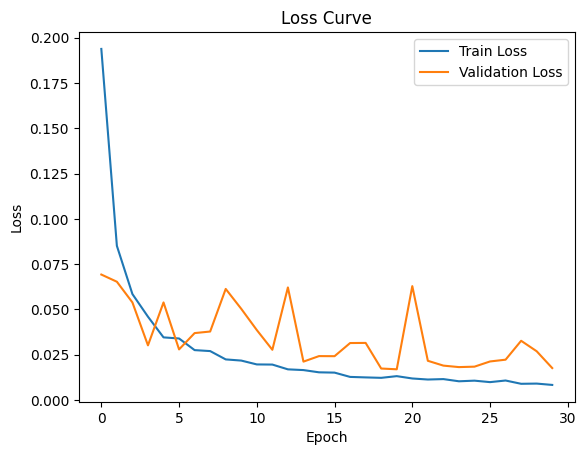

In [ ]:
import matplotlib.pyplot as plt

plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")
plt.show()


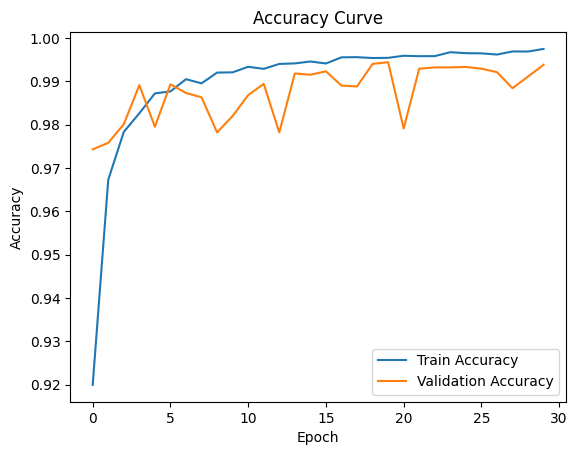

In [ ]:
plt.plot(train_accuracies, label="Train Accuracy")
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Curve")
plt.show()


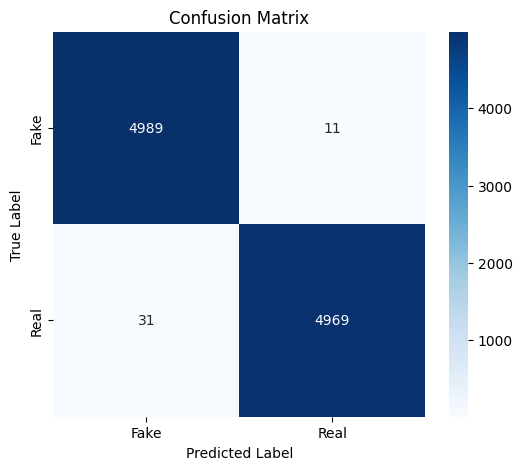


Classification Report:

              precision    recall  f1-score   support

        Fake       0.99      1.00      1.00      5000
        Real       1.00      0.99      1.00      5000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# est Evaluation + Confusion Matrix + Precision/Recall/F1
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = outputs.max(1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Fake", "Real"],
            yticklabels=["Fake", "Real"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Classification Report: Precision, Recall, F1
report = classification_report(all_labels, all_preds, target_names=["Fake", "Real"])
print("\nClassification Report:\n")
print(report)


In [ ]:
!pip install timm


In [ ]:
import timm
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


model = timm.create_model("vit_tiny_patch16_224", pretrained=False)
model.head = nn.Linear(model.num_features, 1)

model = model.to(device)
print("ViT-Tiny ready ,Total params:", sum(p.numel() for p in model.parameters()))


Using device: cuda
ViT-Tiny ready ,Total params: 5524609


In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


In [ ]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss, correct, total = 0, 0, 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device).float()

        optimizer.zero_grad()
        outputs = model(imgs).squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * imgs.size(0)
        preds = (torch.sigmoid(outputs) > 0.5).long()
        correct += (preds == labels.long()).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total

def evaluate(model, loader, criterion):
    model.eval()
    running_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device).float()
            outputs = model(imgs).squeeze(1)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * imgs.size(0)
            preds = (torch.sigmoid(outputs) > 0.5).long()
            correct += (preds == labels.long()).sum().item()
            total += labels.size(0)

    return running_loss / total,correct/total

In [ ]:
epochs = 30
best_val_acc = 0

train_losses, val_losses = [], []
train_accs, val_accs = [], []

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")

    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = evaluate(model, val_loader, criterion)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "best_vit_tiny_fake_real.pth")
        print(" Best model saved")


Epoch 1/30
Train Loss: 0.6861 | Train Acc: 0.5487
Val   Loss: 0.6675 | Val   Acc: 0.5927
 Best model saved

Epoch 2/30
Train Loss: 0.6571 | Train Acc: 0.6087
Val   Loss: 0.6376 | Val   Acc: 0.6360
 Best model saved

Epoch 3/30
Train Loss: 0.6187 | Train Acc: 0.6553
Val   Loss: 0.5846 | Val   Acc: 0.6934
 Best model saved

Epoch 4/30
Train Loss: 0.5757 | Train Acc: 0.6983
Val   Loss: 0.5634 | Val   Acc: 0.7077
 Best model saved

Epoch 5/30
Train Loss: 0.5400 | Train Acc: 0.7268
Val   Loss: 0.5209 | Val   Acc: 0.7428
 Best model saved

Epoch 6/30
Train Loss: 0.5056 | Train Acc: 0.7512
Val   Loss: 0.5258 | Val   Acc: 0.7384

Epoch 7/30
Train Loss: 0.4851 | Train Acc: 0.7670
Val   Loss: 0.4638 | Val   Acc: 0.7793
 Best model saved

Epoch 8/30
Train Loss: 0.4624 | Train Acc: 0.7817
Val   Loss: 0.4733 | Val   Acc: 0.7762

Epoch 9/30
Train Loss: 0.4414 | Train Acc: 0.7936
Val   Loss: 0.4440 | Val   Acc: 0.7915
 Best model saved

Epoch 10/30
Train Loss: 0.4275 | Train Acc: 0.8008
Val   Loss: 

              precision    recall  f1-score   support

        real       0.86      0.90      0.88      5000
        fake       0.90      0.85      0.87      5000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



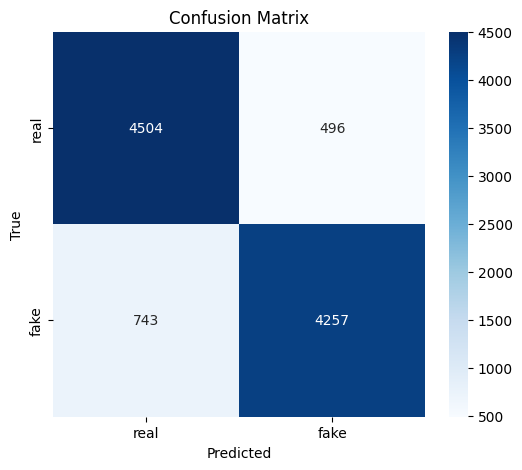

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np



model.load_state_dict(torch.load("best_vit_tiny_fake_real.pth"))
model.eval()

all_labels = []
all_preds = []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        labels = labels.numpy()
        outputs = model(imgs).squeeze(1)
        probs = torch.sigmoid(outputs).cpu().numpy()
        preds = (probs > 0.5).astype(int)
        all_labels.extend(labels)
        all_preds.extend(preds)

# Precision, Recall, F1
print(classification_report(all_labels, all_preds, target_names=["real","fake"]))

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["real", "fake"],
            yticklabels=["real", "fake"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

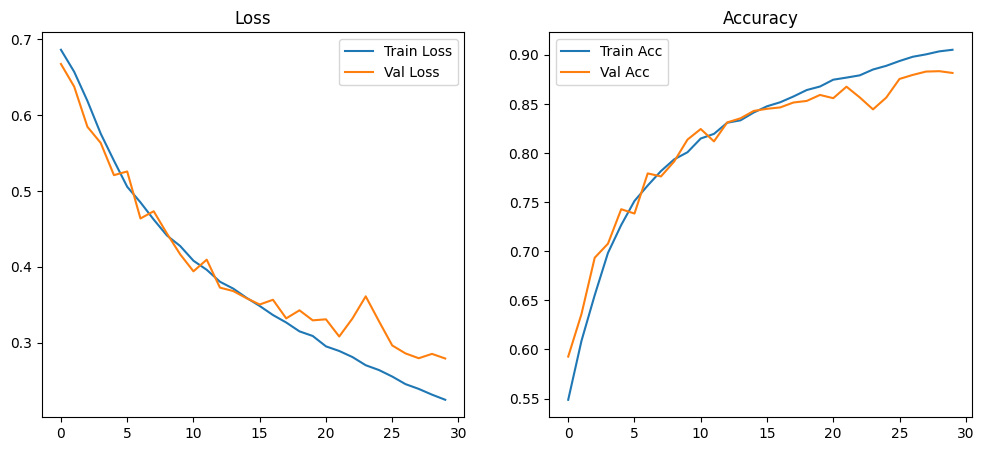

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.legend()
plt.title("Loss")

plt.subplot(1,2,2)
plt.plot(train_accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.legend()
plt.title("Accuracy")

plt.show()

In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(128 * 28 * 28, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SimpleCNN(num_classes=2).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [ ]:
import torch.nn.functional as F

num_epochs = 30

train_losses = []
val_losses   = []
train_accs   = []
val_accs     = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0
    correct, total = 0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # VALIDATION
    model.eval()
    val_running_loss = 0
    val_correct, val_total = 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()

            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_loss = val_running_loss / len(val_loader)
    val_acc = val_correct / val_total

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"Epoch [{epoch+1}/{num_epochs}] "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

Epoch [1/30] Train Loss: 0.6381, Train Acc: 0.6367 | Val Loss: 0.5481, Val Acc: 0.7232
Epoch [2/30] Train Loss: 0.5199, Train Acc: 0.7466 | Val Loss: 0.4485, Val Acc: 0.7908
Epoch [3/30] Train Loss: 0.4493, Train Acc: 0.7925 | Val Loss: 0.4045, Val Acc: 0.8224
Epoch [4/30] Train Loss: 0.4019, Train Acc: 0.8218 | Val Loss: 0.3324, Val Acc: 0.8565
Epoch [5/30] Train Loss: 0.3645, Train Acc: 0.8411 | Val Loss: 0.3158, Val Acc: 0.8635
Epoch [6/30] Train Loss: 0.3415, Train Acc: 0.8535 | Val Loss: 0.2830, Val Acc: 0.8819
Epoch [7/30] Train Loss: 0.3139, Train Acc: 0.8642 | Val Loss: 0.2482, Val Acc: 0.8960
Epoch [8/30] Train Loss: 0.2969, Train Acc: 0.8761 | Val Loss: 0.2409, Val Acc: 0.9030
Epoch [9/30] Train Loss: 0.2792, Train Acc: 0.8849 | Val Loss: 0.2519, Val Acc: 0.9005
Epoch [10/30] Train Loss: 0.2644, Train Acc: 0.8904 | Val Loss: 0.2367, Val Acc: 0.9043
Epoch [11/30] Train Loss: 0.2527, Train Acc: 0.8969 | Val Loss: 0.2213, Val Acc: 0.9096
Epoch [12/30] Train Loss: 0.2433, Train A

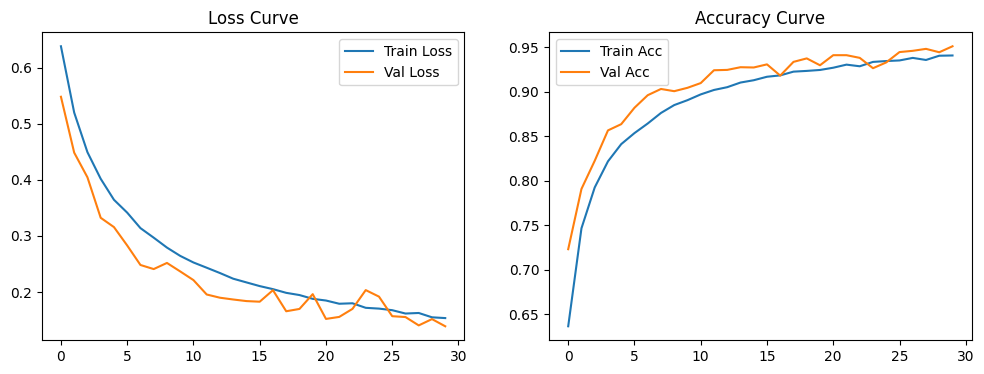

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4))

# Loss Curve
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.title("Loss Curve")
plt.legend()

# Accuracy Curve
plt.subplot(1,2,2)
plt.plot(train_accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.title("Accuracy Curve")
plt.legend()

plt.show()

Test Accuracy: 0.9494


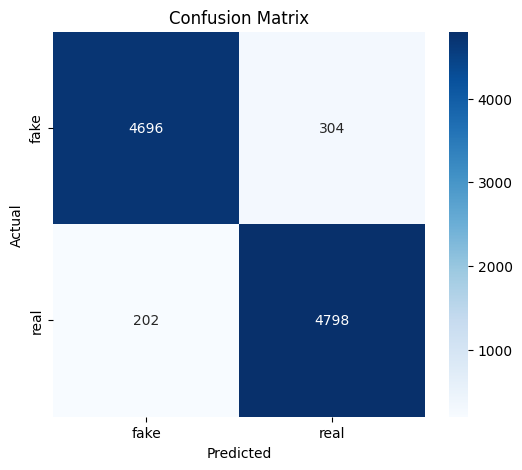

Classification Report:

              precision    recall  f1-score   support

        fake       0.96      0.94      0.95      5000
        real       0.94      0.96      0.95      5000

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import torch

# evaluation mode
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Accuracy
test_acc = accuracy_score(all_labels, all_preds)
print(f"Test Accuracy: {test_acc:.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Precision, Recall, F1-score
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes)
print("Classification Report:\n")
print(report)


In [ ]:
model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# classifier
num_features = model.classifier.in_features
model.classifier = nn.Linear(num_features, 2)

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 115MB/s]


In [ ]:
train_losses = []
val_losses   = []
train_accs   = []
val_accs     = []

best_val_acc = 0


for epoch in range(30):

    model.train()
    running_loss = 0
    correct, total = 0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_loss = running_loss / len(train_loader)
    train_acc  = correct / total

    # Validation
    model.eval()
    val_running_loss = 0
    val_correct, val_total = 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_running_loss += loss.item()
            _, preds = torch.max(outputs, 1)

            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_loss = val_running_loss / len(val_loader)
    val_acc  = val_correct / val_total

    # Save results
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"Epoch [{epoch+1}/30] Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "best_densenet121.pth")
        print(" Saved Best Model")


Epoch [1/30] Train Loss: 0.0320, Train Acc: 0.9881 | Val Loss: 0.0164, Val Acc: 0.9948
 Saved Best Model
Epoch [2/30] Train Loss: 0.0275, Train Acc: 0.9897 | Val Loss: 0.0184, Val Acc: 0.9928
Epoch [3/30] Train Loss: 0.0239, Train Acc: 0.9917 | Val Loss: 0.0092, Val Acc: 0.9973
 Saved Best Model
Epoch [4/30] Train Loss: 0.0218, Train Acc: 0.9919 | Val Loss: 0.0116, Val Acc: 0.9955
Epoch [5/30] Train Loss: 0.0174, Train Acc: 0.9937 | Val Loss: 0.0254, Val Acc: 0.9910
Epoch [6/30] Train Loss: 0.0168, Train Acc: 0.9940 | Val Loss: 0.0177, Val Acc: 0.9933
Epoch [7/30] Train Loss: 0.0166, Train Acc: 0.9940 | Val Loss: 0.0125, Val Acc: 0.9960
Epoch [8/30] Train Loss: 0.0142, Train Acc: 0.9952 | Val Loss: 0.0142, Val Acc: 0.9947
Epoch [9/30] Train Loss: 0.0131, Train Acc: 0.9953 | Val Loss: 0.0080, Val Acc: 0.9971
Epoch [10/30] Train Loss: 0.0120, Train Acc: 0.9960 | Val Loss: 0.0171, Val Acc: 0.9936
Epoch [11/30] Train Loss: 0.0116, Train Acc: 0.9957 | Val Loss: 0.0201, Val Acc: 0.9927
Epoch

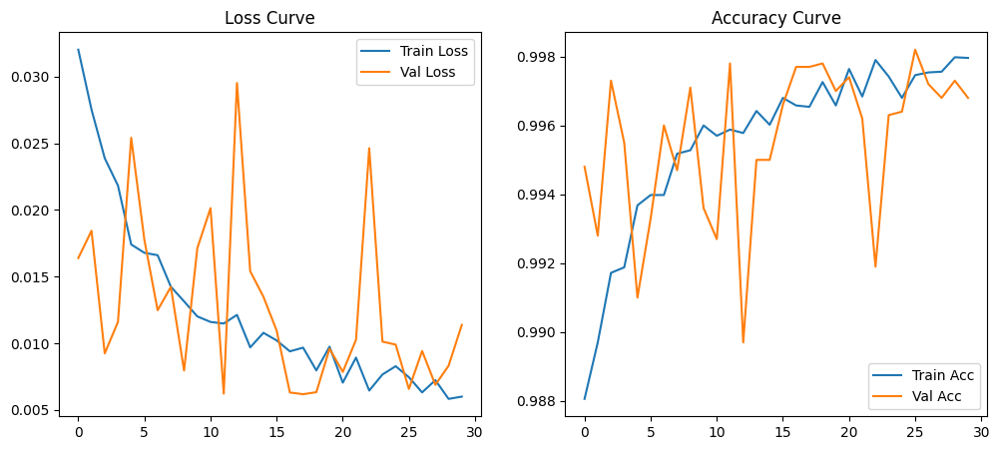

In [ ]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.title("Loss Curve")
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.title("Accuracy Curve")
plt.legend()

plt.show()



 Test Accuracy: 0.9972


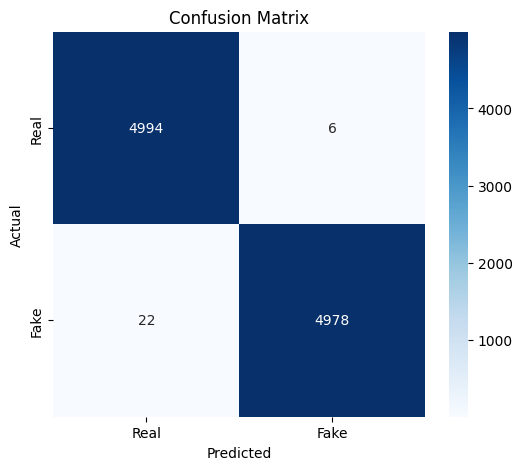


 Classification Report:

              precision    recall  f1-score   support

        Real       1.00      1.00      1.00      5000
        Fake       1.00      1.00      1.00      5000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix, classification_report


model.load_state_dict(torch.load("best_densenet121.pth"))
model.eval()


y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

test_acc = np.mean(np.array(y_true) == np.array(y_pred))
print("\n Test Accuracy:", round(test_acc, 4))


class_names = ["Real", "Fake"]

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("\n Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))


In [ ]:

# CNN Block

class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )
    def forward(self, x):
        return self.block(x)


# Hybrid CNN + Transformer
class HybridCMT(nn.Module):
    def __init__(self, num_classes=2, embed_dim=256, heads=4, depth=2):
        super().__init__()

        # CNN Feature Extractor
        self.cnn = nn.Sequential(
            CNNBlock(3, 32),
            CNNBlock(32, 64),
            CNNBlock(64, 128),
        )

        # Projection CNN Transformer
        self.project = nn.Linear(128, embed_dim)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim, nhead=heads, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=depth)

        # Classification Head
        self.classifier = nn.Sequential(
            nn.Linear(embed_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        # CNN stage
        x = self.cnn(x)

        # Flatten + transpose for Transformer
        B, C, H, W = x.shape
        x = x.flatten(2)
        x = x.transpose(1, 2)

        # Project features
        x = self.project(x)

        # Transformer
        x = self.transformer(x)
        x = x.mean(dim=1)

        # Classification
        return self.classifier(x)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = HybridCMT(num_classes=2, embed_dim=256).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-4)


In [ ]:
num_epochs = 30

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_loss = running_loss / total
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_loss /= val_total
    val_acc = val_correct / val_total

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")


Epoch 1/30 | Train Loss: 0.6783 | Train Acc: 0.5734 | Val Loss: 0.6643 | Val Acc: 0.5933
Epoch 2/30 | Train Loss: 0.6601 | Train Acc: 0.6081 | Val Loss: 0.6464 | Val Acc: 0.6305
Epoch 3/30 | Train Loss: 0.6339 | Train Acc: 0.6480 | Val Loss: 0.6193 | Val Acc: 0.6617
Epoch 4/30 | Train Loss: 0.6187 | Train Acc: 0.6635 | Val Loss: 0.6175 | Val Acc: 0.6556
Epoch 5/30 | Train Loss: 0.6288 | Train Acc: 0.6516 | Val Loss: 0.6358 | Val Acc: 0.6387
Epoch 6/30 | Train Loss: 0.6162 | Train Acc: 0.6670 | Val Loss: 0.6202 | Val Acc: 0.6685
Epoch 7/30 | Train Loss: 0.6120 | Train Acc: 0.6697 | Val Loss: 0.6230 | Val Acc: 0.6557
Epoch 8/30 | Train Loss: 0.6033 | Train Acc: 0.6779 | Val Loss: 0.5967 | Val Acc: 0.6864
Epoch 9/30 | Train Loss: 0.6016 | Train Acc: 0.6804 | Val Loss: 0.5947 | Val Acc: 0.6868
Epoch 10/30 | Train Loss: 0.6049 | Train Acc: 0.6745 | Val Loss: 0.5978 | Val Acc: 0.6807
Epoch 11/30 | Train Loss: 0.6476 | Train Acc: 0.6198 | Val Loss: 0.6927 | Val Acc: 0.5681
Epoch 12/30 | Train

In [ ]:
# Test evaluation
model.eval()

correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = correct / total
print(f"Test Accuracy: {accuracy:.4f}")


Test Accuracy: 0.5564


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import torch

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


In [ ]:
torch.save(model.state_dict(), "hybrid_cmt_model.pth")
print("Model saved successfully!")


Model saved successfully!


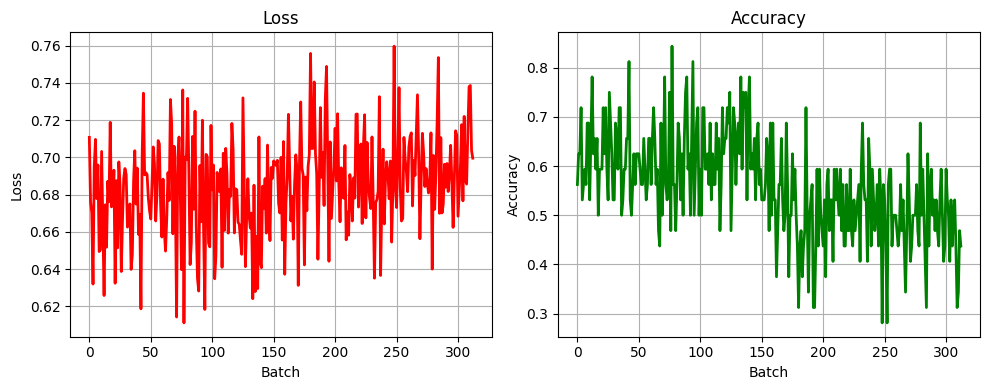

In [ ]:
import matplotlib.pyplot as plt
import torch

train_losses = []
train_accs = []

model.eval()
correct = 0
total = 0
running_loss = 0.0

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * images.size(0)

        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()


        train_losses.append(loss.item())
        train_accs.append((predicted == labels).float().mean().item())

# Plot
plt.figure(figsize=(10,4))

# Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, color='red', linewidth=2)
plt.title("Loss")
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.grid(True)

# Accuracy (Green)
plt.subplot(1, 2, 2)
plt.plot(train_accs, color='green', linewidth=2)
plt.title("Accuracy")
plt.xlabel("Batch")
plt.ylabel("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()


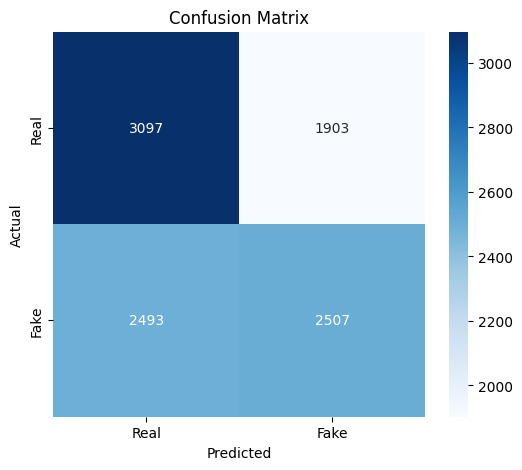

Classification Report (Precision, Recall, F1-Score):
              precision    recall  f1-score   support

        Real       0.55      0.62      0.58      5000
        Fake       0.57      0.50      0.53      5000

    accuracy                           0.56     10000
   macro avg       0.56      0.56      0.56     10000
weighted avg       0.56      0.56      0.56     10000



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Precision, Recall, F1 Score
print("Classification Report (Precision, Recall, F1-Score):")
print(classification_report(all_labels, all_preds, target_names=['Real','Fake']))


In [ ]:
import torch
import torch.nn as nn

# Patch Embedding
class PatchEmbedding(nn.Module):
    def __init__(self, img_size=224, patch_size=32, in_channels=3, embed_dim=192):
        super().__init__()
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2)
        x = x.transpose(1, 2)
        return x

# PiT Block
class PiTBlock(nn.Module):
    def __init__(self, embed_dim=192, heads=3, mlp_dim=384):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, heads, batch_first=True)
        self.norm2 = nn.LayerNorm(embed_dim)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_dim),
            nn.GELU(),
            nn.Linear(mlp_dim, embed_dim)
        )
        self.pool = nn.AvgPool1d(kernel_size=2, stride=2)

    def forward(self, x):
        x_res = x
        x = self.norm1(x)
        x, _ = self.attn(x, x, x)
        x = x + x_res

        x_res2 = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = x + x_res2

        B, N, C = x.shape
        if N % 2 == 0:
            x = x.transpose(1,2)
            x = self.pool(x)
            x = x.transpose(1,2)
        return x

# PiT-Small Model
class PiTSmall(nn.Module):
    def __init__(self, num_classes=2, img_size=224, patch_size=32, embed_dim=192, depth=3, heads=3, mlp_dim=384):
        super().__init__()
        self.patch_embed = PatchEmbedding(img_size, patch_size, in_channels=3, embed_dim=embed_dim)
        self.blocks = nn.ModuleList([PiTBlock(embed_dim, heads, mlp_dim) for _ in range(depth)])
        self.classifier = nn.Linear(embed_dim, num_classes)

    def forward(self, x):
        x = self.patch_embed(x)
        for blk in self.blocks:
            x = blk(x)
        x = x.mean(dim=1)
        x = self.classifier(x)
        return x


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PiTSmall(num_classes=2).to(device)
print(model)


PiTSmall(
  (patch_embed): PatchEmbedding(
    (proj): Conv2d(3, 192, kernel_size=(32, 32), stride=(32, 32))
  )
  (blocks): ModuleList(
    (0-2): 3 x PiTBlock(
      (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
      (attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=192, out_features=192, bias=True)
      )
      (norm2): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
      (mlp): Sequential(
        (0): Linear(in_features=192, out_features=384, bias=True)
        (1): GELU(approximate='none')
        (2): Linear(in_features=384, out_features=192, bias=True)
      )
      (pool): AvgPool1d(kernel_size=(2,), stride=(2,), padding=(0,))
    )
  )
  (classifier): Linear(in_features=192, out_features=2, bias=True)
)


In [ ]:
import torch.nn as nn
import torch.optim as optim

# loss function
criterion = nn.CrossEntropyLoss()

# optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-3)



In [ ]:
train_losses = []
val_losses = []
train_accs = []
val_accs = []

num_epochs = 30

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_loss = running_loss / total
    train_acc = correct / total
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_loss /= val_total
    val_acc = val_correct / val_total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")


Epoch 1/30 | Train Loss: 0.6735 | Train Acc: 0.6053 | Val Loss: 0.6593 | Val Acc: 0.6226
Epoch 2/30 | Train Loss: 0.6350 | Train Acc: 0.6505 | Val Loss: 0.6764 | Val Acc: 0.6001
Epoch 3/30 | Train Loss: 0.6320 | Train Acc: 0.6538 | Val Loss: 0.6370 | Val Acc: 0.6400
Epoch 4/30 | Train Loss: 0.6172 | Train Acc: 0.6698 | Val Loss: 0.6140 | Val Acc: 0.6739
Epoch 5/30 | Train Loss: 0.6221 | Train Acc: 0.6701 | Val Loss: 0.6558 | Val Acc: 0.6350
Epoch 6/30 | Train Loss: 0.6165 | Train Acc: 0.6715 | Val Loss: 0.6309 | Val Acc: 0.6519
Epoch 7/30 | Train Loss: 0.5993 | Train Acc: 0.6870 | Val Loss: 0.6900 | Val Acc: 0.6120
Epoch 8/30 | Train Loss: 0.5981 | Train Acc: 0.6889 | Val Loss: 0.6327 | Val Acc: 0.6661
Epoch 9/30 | Train Loss: 0.5968 | Train Acc: 0.6890 | Val Loss: 0.6110 | Val Acc: 0.6675
Epoch 10/30 | Train Loss: 0.5950 | Train Acc: 0.6929 | Val Loss: 0.5809 | Val Acc: 0.6998
Epoch 11/30 | Train Loss: 0.5885 | Train Acc: 0.6955 | Val Loss: 0.6625 | Val Acc: 0.6401
Epoch 12/30 | Train

In [ ]:
model.eval()
test_correct = 0
test_total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        test_total += labels.size(0)
        test_correct += predicted.eq(labels).sum().item()

test_acc = test_correct / test_total
print(f"Test Accuracy: {test_acc:.4f}")


Test Accuracy: 0.6948


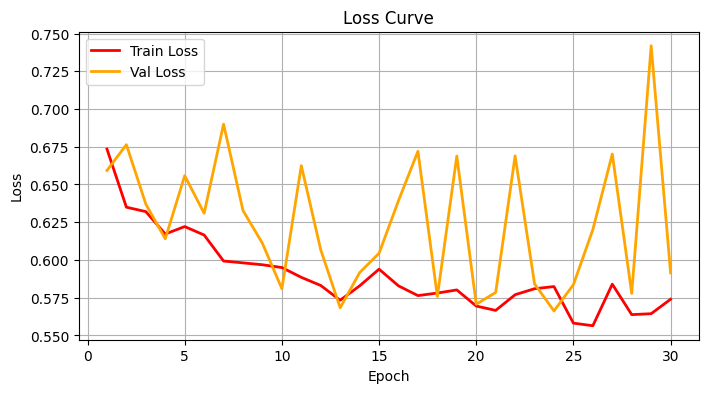

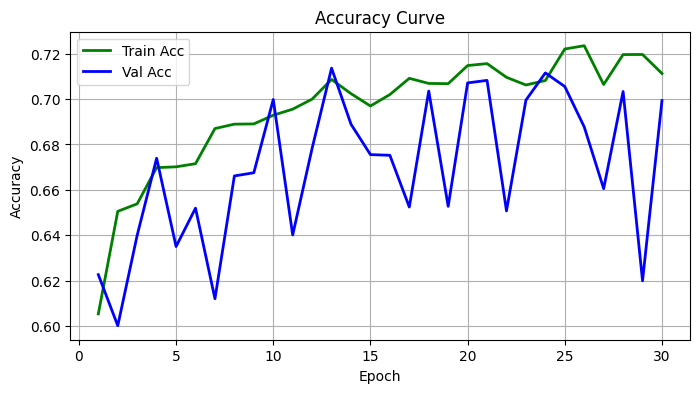

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(8,4))
plt.plot(range(1, len(train_losses)+1), train_losses, label='Train Loss', color='red', linewidth=2)
plt.plot(range(1, len(val_losses)+1), val_losses, label='Val Loss', color='orange', linewidth=2)
plt.title("Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


plt.figure(figsize=(8,4))
plt.plot(range(1, len(train_accs)+1), train_accs, label='Train Acc', color='green', linewidth=2)
plt.plot(range(1, len(val_accs)+1), val_accs, label='Val Acc', color='blue', linewidth=2)
plt.title("Accuracy Curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


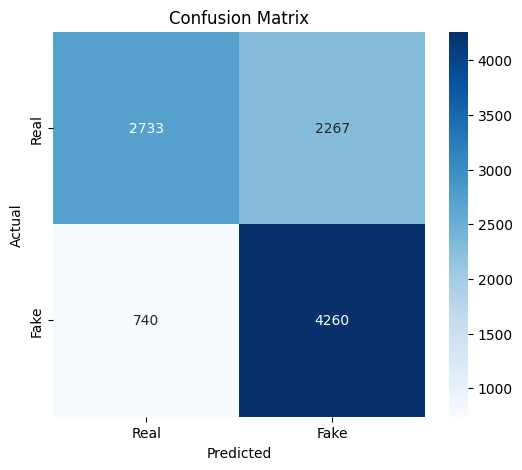

Classification Report:
              precision    recall  f1-score   support

        Real       0.79      0.55      0.65      5000
        Fake       0.65      0.85      0.74      5000

    accuracy                           0.70     10000
   macro avg       0.72      0.70      0.69     10000
weighted avg       0.72      0.70      0.69     10000



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Precision, Recall, F1
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=['Real','Fake']))


In [ ]:
import torch
import torch.nn as nn
from torchvision import models


model = models.efficientnet_b0(pretrained=True)

num_classes = 2
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

model = model.to(device)

print(model)


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 151MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [ ]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
num_epochs = 30

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_loss = running_loss / total
    train_acc = correct / total
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_loss /= val_total
    val_acc = val_correct / val_total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")


Epoch 1/30 | Train Loss: 0.1709 | Train Acc: 0.9274 | Val Loss: 0.0297 | Val Acc: 0.9900
Epoch 2/30 | Train Loss: 0.0575 | Train Acc: 0.9792 | Val Loss: 0.0166 | Val Acc: 0.9945
Epoch 3/30 | Train Loss: 0.0374 | Train Acc: 0.9863 | Val Loss: 0.0102 | Val Acc: 0.9964
Epoch 4/30 | Train Loss: 0.0277 | Train Acc: 0.9903 | Val Loss: 0.0087 | Val Acc: 0.9971
Epoch 5/30 | Train Loss: 0.0202 | Train Acc: 0.9926 | Val Loss: 0.0086 | Val Acc: 0.9966
Epoch 6/30 | Train Loss: 0.0183 | Train Acc: 0.9933 | Val Loss: 0.0079 | Val Acc: 0.9976
Epoch 7/30 | Train Loss: 0.0165 | Train Acc: 0.9942 | Val Loss: 0.0062 | Val Acc: 0.9974
Epoch 8/30 | Train Loss: 0.0129 | Train Acc: 0.9956 | Val Loss: 0.0041 | Val Acc: 0.9983
Epoch 9/30 | Train Loss: 0.0128 | Train Acc: 0.9956 | Val Loss: 0.0056 | Val Acc: 0.9978
Epoch 10/30 | Train Loss: 0.0116 | Train Acc: 0.9957 | Val Loss: 0.0042 | Val Acc: 0.9985
Epoch 11/30 | Train Loss: 0.0105 | Train Acc: 0.9964 | Val Loss: 0.0044 | Val Acc: 0.9984
Epoch 12/30 | Train

In [ ]:
model.eval()
test_correct = 0
test_total = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        test_total += labels.size(0)
        test_correct += predicted.eq(labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = test_correct / test_total
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.9985


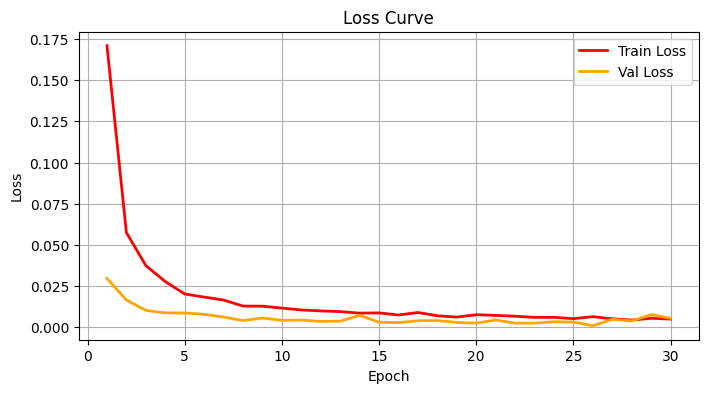

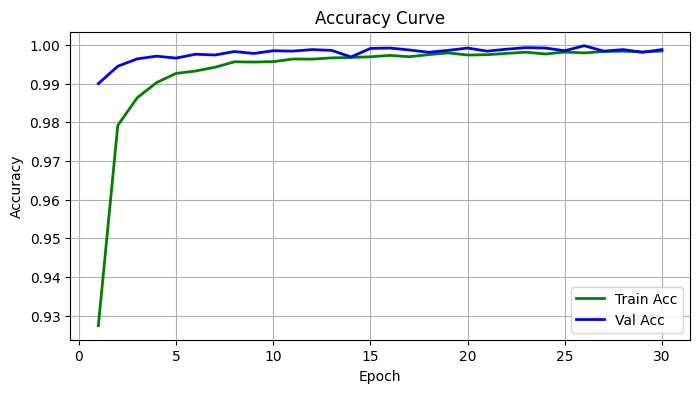

In [ ]:
import matplotlib.pyplot as plt

# Loss Curve
plt.figure(figsize=(8,4))
plt.plot(range(1, len(train_losses)+1), train_losses, label='Train Loss', color='red', linewidth=2)
plt.plot(range(1, len(val_losses)+1), val_losses, label='Val Loss', color='orange', linewidth=2)
plt.title("Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Accuracy Curve
plt.figure(figsize=(8,4))
plt.plot(range(1, len(train_accs)+1), train_accs, label='Train Acc', color='green', linewidth=2)
plt.plot(range(1, len(val_accs)+1), val_accs, label='Val Acc', color='blue', linewidth=2)
plt.title("Accuracy Curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


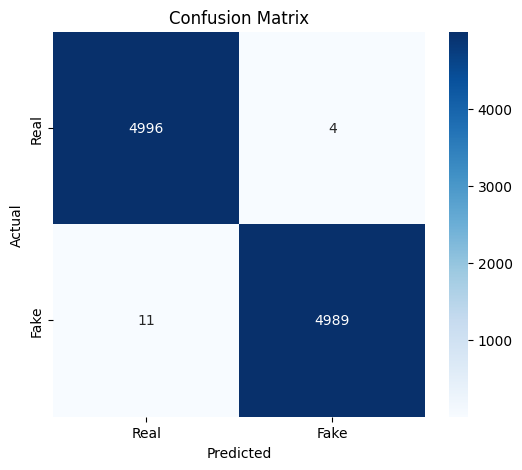


Classification Report:
              precision    recall  f1-score   support

        Real       1.00      1.00      1.00      5000
        Fake       1.00      1.00      1.00      5000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Real','Fake'], yticklabels=['Real','Fake'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Precision, Recall, F1 Score
print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=['Real','Fake']))
